<a href="https://colab.research.google.com/github/escuccim/pytorch-face-autoencoder/blob/master/DenoisingDecoder4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
!nvidia-smi

Wed Jan  1 06:46:46 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.44       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P0    25W / 250W |      0MiB / 16280MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [0]:
import torch
import torchvision
from torch import nn
from torch.utils.data import DataLoader
from matplotlib import pyplot as plt, colors
%matplotlib inline
import zipfile
import os
import matplotlib.animation as animation
import torchvision.utils as vutils
import numpy as np
import random
import shutil
import pandas as pd
import torch.nn.functional as F
from torch.autograd import Variable
from torch.utils.data import Dataset
from torch.optim import RMSprop,Adam,SGD
from torch.optim.lr_scheduler import ExponentialLR,MultiStepLR
import progressbar
from torchvision.utils import make_grid
from torchvision import models
from scipy.io import loadmat
from google.colab import auth
import PIL
auth.authenticate_user()

# upload checkpoint to GCS
project_id = 'mammography-198911'
bucket_name = 'gan-faces'

!gcloud config set project {project_id}

Updated property [core/project].


In [0]:
enc_model_save_path = "ae_noise_enc_4a.pt"
dec_model_save_path = "ae_noise_dec_4a.pt"
opt_save_path = "opt_ae_noise_4a.pt"
enc_opt_save_path = "opt_ae_noise_enc_4a.pt"
dec_opt_save_path = "opt_ae_noise_dec_4a.pt"

In [0]:
if not os.path.exists(enc_model_save_path):
    !gsutil cp gs://{bucket_name}/{enc_model_save_path} ./{enc_model_save_path} 
    !gsutil cp gs://{bucket_name}/{dec_model_save_path} ./{dec_model_save_path} 
    !gsutil cp gs://{bucket_name}/{opt_save_path} ./{opt_save_path}

Copying gs://gan-faces/ae_noise_enc_4a.pt...
| [1 files][126.1 MiB/126.1 MiB]                                                
Operation completed over 1 objects/126.1 MiB.                                    
Copying gs://gan-faces/ae_noise_dec_4a.pt...
/ [1 files][142.6 MiB/142.6 MiB]                                                
Operation completed over 1 objects/142.6 MiB.                                    
Copying gs://gan-faces/opt_ae_noise_4a.pt...
\ [1 files][268.5 MiB/268.5 MiB]                                                
Operation completed over 1 objects/268.5 MiB.                                    


In [0]:
# if not os.path.exists("celeba-dataset.zip"):
# #   !kaggle datasets download -d jessicali9530/celeba-dataset
#   !gsutil cp gs://{bucket_name}/celeba-dataset.zip ./celeba-dataset.zip
#   zip_ref = zipfile.ZipFile('celeba-dataset.zip', 'r')
#   zip_ref.extractall('data')
#   zip_ref.close()

#   zip_ref = zipfile.ZipFile('data/img_align_celeba.zip', 'r')
#   zip_ref.extractall('data/images')
#   zip_ref.close()

if not os.path.exists("wiki_images_good.zip"):
  !gsutil cp gs://{bucket_name}/wiki_images_good.zip ./ 
  zip_ref = zipfile.ZipFile('wiki_images_good.zip', 'r')
  zip_ref.extractall('data/wiki_images')
  zip_ref.close()  

if not os.path.exists("celeb_a_good.zip"):
#   !kaggle datasets download -d jessicali9530/celeba-dataset
  !gsutil cp gs://{bucket_name}/celeb_a_good.zip ./celeb_a_good.zip
  zip_ref = zipfile.ZipFile('celeb_a_good.zip', 'r')
  zip_ref.extractall('data/images/celeb_a')
  zip_ref.close()

if not os.path.exists("Training_Pictures.zip"):
  !wget https://s3.eu-west-3.amazonaws.com/deep.skoo.ch/Training_Pictures.zip
  zip_ref = zipfile.ZipFile('Training_Pictures.zip', 'r')
  zip_ref.extractall('data/images/training')
  zip_ref.close()

if not os.path.exists("imdb_crop_good.zip"):  
  !gsutil cp gs://{bucket_name}/imdb_crop_good.zip ./imdb_crop_good.zip
  zip_ref = zipfile.ZipFile('imdb_crop_good.zip', 'r')
  zip_ref.extractall('data/images/imdb')
  zip_ref.close()

# if not os.path.exists("imdb_crop_test.zip"):
#   !gsutil cp gs://pneumonia/imdb_crop_test.zip ./imdb_crop_test.zip
#   zip_ref = zipfile.ZipFile('imdb_crop_test.zip', 'r')
#   zip_ref.extractall('data/images/')
#   zip_ref.close()     

# if not os.path.exists("named_celebs_good2.zip"):  
#   !gsutil cp gs://{bucket_name}/named_celebs_good2.zip ./named_celebs_good2.zip
#   zip_ref = zipfile.ZipFile('named_celebs_good2.zip', 'r')
#   zip_ref.extractall('data/images/')
#   zip_ref.close()

Copying gs://gan-faces/wiki_images_good.zip...
\ [1 files][ 94.7 MiB/ 94.7 MiB]                                                
Operation completed over 1 objects/94.7 MiB.                                     
Copying gs://gan-faces/celeb_a_good.zip...
/ [1 files][  1.1 GiB/  1.1 GiB]   62.9 MiB/s                                   
Operation completed over 1 objects/1.1 GiB.                                      
--2020-01-01 06:48:29--  https://s3.eu-west-3.amazonaws.com/deep.skoo.ch/Training_Pictures.zip
Resolving s3.eu-west-3.amazonaws.com (s3.eu-west-3.amazonaws.com)... 52.95.154.21
Connecting to s3.eu-west-3.amazonaws.com (s3.eu-west-3.amazonaws.com)|52.95.154.21|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 955202 (933K) [application/zip]
Saving to: ‘Training_Pictures.zip’

Training_Pictures.z 100%[===================>] 932.81K  1.14MB/s    in 0.8s    

2020-01-01 06:48:30 (1.14 MB/s) - ‘Training_Pictures.zip’ saved [955202/955202]

Copying gs://gan-fac

In [0]:
if not os.path.exists("wiki_crop_test.zip"):
  !gsutil cp gs://pneumonia/wiki_crop_test.zip ./wiki_crop_test.zip
  zip_ref = zipfile.ZipFile('wiki_crop_test.zip', 'r')
  zip_ref.extractall('data/test_images/')
  zip_ref.close()   

if not os.path.exists("imdb_crop_test.zip"):
  !gsutil cp gs://pneumonia/imdb_crop_test.zip ./imdb_crop_test.zip
  zip_ref = zipfile.ZipFile('imdb_crop_test.zip', 'r')
  zip_ref.extractall('data/test_images/')
  zip_ref.close()     

Copying gs://pneumonia/wiki_crop_test.zip...
\ [1 files][ 27.5 MiB/ 27.5 MiB]                                                
Operation completed over 1 objects/27.5 MiB.                                     
Copying gs://pneumonia/imdb_crop_test.zip...
- [1 files][216.8 MiB/216.8 MiB]                                                
Operation completed over 1 objects/216.8 MiB.                                    


In [0]:
batch_size = BATCH_SIZE = 64
data_path = "data/images/"
image_size = (160,160)

transform = torchvision.transforms.Compose(
    [torchvision.transforms.RandomHorizontalFlip(p=0.5), 
     torchvision.transforms.RandomResizedCrop(image_size, scale=(0.95, 1.10)), 
     torchvision.transforms.RandomApply([
        torchvision.transforms.RandomAffine(degrees=2, translate=(0.05,0.05), scale=(0.95,1.05), shear=2, resample=False, fillcolor=0),        
      ], 0.7),
      # torchvision.transforms.ToTensor(),
      # torchvision.transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])

tensor_normalize = torchvision.transforms.Compose([
      torchvision.transforms.ToTensor(),
      torchvision.transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])

noise_transform = torchvision.transforms.Lambda(lambda x: x + (torch.rand(x.shape) * 0.25))

class SkewedImageFolder(torchvision.datasets.ImageFolder):
  def __getitem__(self, index):
        """
        Args:
            index (int): Index
        Returns:
            tuple: (sample, target) where target is class_index of the target class.
        """
        path, target = self.samples[index]
        sample0 = self.loader(path)
        if self.transform is not None:
            target = self.transform(sample0)
        
        sample = target.copy()

        sample = sample.filter(PIL.ImageFilter.GaussianBlur(radius = 2))
        sample = noise_transform(tensor_normalize(sample))
        target = tensor_normalize(target)

        return sample, target

transform_mega = torchvision.transforms.Compose([
      torchvision.transforms.RandomAffine(degrees=4, translate=(0.1,0.1), scale=(0.90,1.10), shear=8, resample=PIL.Image.BILINEAR, fillcolor=0),        
    ])

train_dataset = SkewedImageFolder(
        root=data_path,
        transform=transform,
        target_transform=transform_mega
    )

train_loader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=batch_size,
    num_workers=7,
    shuffle=True
)        

train_dataset = SkewedImageFolder(
        root=data_path,
        transform=transform,
        target_transform=transform_mega
    )

train_loader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=batch_size,
    num_workers=7,
    shuffle=True
)        

test_dataset = SkewedImageFolder(
        root="data/test_images/",
        transform=transform,
        target_transform=transform_mega
    )

test_loader = torch.utils.data.DataLoader(
    test_dataset,
    batch_size=batch_size,
    num_workers=2,
    shuffle=True
)

print(train_dataset)

Dataset SkewedImageFolder
    Number of datapoints: 259299
    Root location: data/images/
    StandardTransform
Transform: Compose(
               RandomHorizontalFlip(p=0.5)
               RandomResizedCrop(size=(160, 160), scale=(0.95, 1.1), ratio=(0.75, 1.3333), interpolation=PIL.Image.BILINEAR)
               RandomApply(
               p=0.7
               RandomAffine(degrees=(-2, 2), translate=(0.05, 0.05), scale=(0.95, 1.05), shear=(-2, 2))
           )
           )
Target transform: Compose(
                      RandomAffine(degrees=(-4, 4), translate=(0.1, 0.1), scale=(0.9, 1.1), shear=(-8, 8), resample=PIL.Image.BILINEAR)
                  )


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


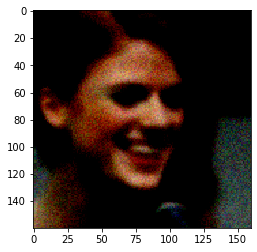

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


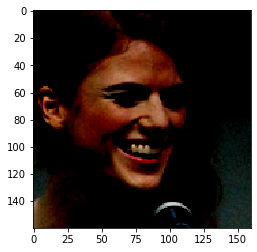

In [0]:
for (inputs, labels) in train_loader:
    plt.imshow(np.transpose(inputs[0].detach().cpu(), (1,2,0)))
    plt.show()

    plt.imshow(np.transpose(labels[0].detach().cpu(), (1,2,0)))
    plt.show()
    break

### Create Our Models


In [0]:
__all__ = ['ResNet', 'resnet18', 'resnet34', 'resnet50', 'resnet101',
           'resnet152', 'resnext50_32x4d', 'resnext101_32x8d',
           'wide_resnet50_2', 'wide_resnet101_2']


model_urls = {
    'resnet18': 'https://download.pytorch.org/models/resnet18-5c106cde.pth',
    'resnet34': 'https://download.pytorch.org/models/resnet34-333f7ec4.pth',
    'resnet50': 'https://download.pytorch.org/models/resnet50-19c8e357.pth',
    'resnet101': 'https://download.pytorch.org/models/resnet101-5d3b4d8f.pth',
    'resnet152': 'https://download.pytorch.org/models/resnet152-b121ed2d.pth',
    'resnext50_32x4d': 'https://download.pytorch.org/models/resnext50_32x4d-7cdf4587.pth',
    'resnext101_32x8d': 'https://download.pytorch.org/models/resnext101_32x8d-8ba56ff5.pth',
    'wide_resnet50_2': 'https://download.pytorch.org/models/wide_resnet50_2-95faca4d.pth',
    'wide_resnet101_2': 'https://download.pytorch.org/models/wide_resnet101_2-32ee1156.pth',
}


def conv3x3(in_planes, out_planes, stride=1, groups=1, dilation=1):
    """3x3 convolution with padding"""
    return nn.Conv2d(in_planes, out_planes, kernel_size=3, stride=stride,
                     padding=dilation, groups=groups, bias=False, dilation=dilation)


def conv1x1(in_planes, out_planes, stride=1):
    """1x1 convolution"""
    return nn.Conv2d(in_planes, out_planes, kernel_size=1, stride=stride, bias=False)


class BasicBlock(nn.Module):
    expansion = 1
    __constants__ = ['downsample']

    def __init__(self, inplanes, planes, stride=1, downsample=None, groups=1,
                 base_width=64, dilation=1, norm_layer=None):
        super(BasicBlock, self).__init__()
        if norm_layer is None:
            norm_layer = nn.BatchNorm2d
        if groups != 1 or base_width != 64:
            raise ValueError('BasicBlock only supports groups=1 and base_width=64')
        if dilation > 1:
            raise NotImplementedError("Dilation > 1 not supported in BasicBlock")
        # Both self.conv1 and self.downsample layers downsample the input when stride != 1
        self.conv1 = conv3x3(inplanes, planes, stride)
        self.bn1 = norm_layer(planes)
        self.relu = nn.LeakyReLU(inplace=True)
        self.conv2 = conv3x3(planes, planes)
        self.bn2 = norm_layer(planes)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        identity = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)

        if self.downsample is not None:
            identity = self.downsample(x)

        out += identity
        out = self.relu(out)

        return out


class Bottleneck(nn.Module):
    expansion = 4
    __constants__ = ['downsample']

    def __init__(self, inplanes, planes, stride=1, downsample=None, groups=1,
                 base_width=64, dilation=1, norm_layer=None):
        super(Bottleneck, self).__init__()
        if norm_layer is None:
            norm_layer = nn.BatchNorm2d
        width = int(planes * (base_width / 64.)) * groups
        # Both self.conv2 and self.downsample layers downsample the input when stride != 1
        self.conv1 = conv1x1(inplanes, width)
        self.bn1 = norm_layer(width)
        self.conv2 = conv3x3(width, width, stride, groups, dilation)
        self.bn2 = norm_layer(width)
        self.conv3 = conv1x1(width, planes * self.expansion)
        self.bn3 = norm_layer(planes * self.expansion)
        self.relu = nn.LeakyReLU(inplace=True)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        identity = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)

        out = self.conv3(out)
        out = self.bn3(out)

        if self.downsample is not None:
            identity = self.downsample(x)

        out += identity
        out = self.relu(out)

        return out


class ResNet(nn.Module):

    def __init__(self, block, layers, num_classes=1024, zero_init_residual=False,
                 groups=1, width_per_group=64, replace_stride_with_dilation=None,
                 norm_layer=None):
        super(ResNet, self).__init__()
        if norm_layer is None:
            norm_layer = nn.BatchNorm2d
        self._norm_layer = norm_layer

        self.inplanes = 64
        self.dilation = 1
        if replace_stride_with_dilation is None:
            # each element in the tuple indicates if we should replace
            # the 2x2 stride with a dilated convolution instead
            replace_stride_with_dilation = [False, False, False]
        if len(replace_stride_with_dilation) != 3:
            raise ValueError("replace_stride_with_dilation should be None "
                             "or a 3-element tuple, got {}".format(replace_stride_with_dilation))
        self.groups = groups
        self.base_width = width_per_group
        # in 160x160 - out 80x80
        self.conv1 = nn.Sequential(
            nn.Conv2d(3, self.inplanes, kernel_size=3, stride=1, padding=1, bias=False),
            norm_layer(self.inplanes),
            nn.LeakyReLU(inplace=True),
            nn.Conv2d(self.inplanes, self.inplanes, kernel_size=3, stride=1, padding=1, bias=False),
            norm_layer(self.inplanes),
            nn.LeakyReLU(inplace=True),
            nn.Conv2d(self.inplanes, self.inplanes, kernel_size=3, stride=2, padding=1, bias=False),
            norm_layer(self.inplanes),
            nn.LeakyReLU(inplace=True),
        )
        # in 80x80 - out 40x40
        self.layer1 = self._make_layer(block, 64, layers[0], stride=2)
        # in 40x40 - out 20x20
        self.layer2 = self._make_layer(block, 128, layers[1], stride=2,
                                       dilate=replace_stride_with_dilation[0])
        # in 20x20 - out 10x10
        self.layer3 = self._make_layer(block, 256, layers[2], stride=2,
                                       dilate=replace_stride_with_dilation[1])
        # in 10x10 - out 5x5
        self.layer4 = self._make_layer(block, 512, layers[3], stride=2,
                                       dilate=replace_stride_with_dilation[2])
        self.avgpool = nn.Sequential(
            nn.Conv2d(512, 768, kernel_size=3, stride=1, padding=0, bias=False),
            norm_layer(768),
            nn.LeakyReLU(inplace=True),
            nn.Conv2d(768, 1024, kernel_size=3, stride=1, padding=0, bias=False),
            norm_layer(1024),
            nn.LeakyReLU(inplace=True),
            
        )
        self.fc = nn.Linear(1024 * block.expansion, num_classes)

        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, (nn.BatchNorm2d, nn.GroupNorm)):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)

        # Zero-initialize the last BN in each residual branch,
        # so that the residual branch starts with zeros, and each residual block behaves like an identity.
        # This improves the model by 0.2~0.3% according to https://arxiv.org/abs/1706.02677
        if zero_init_residual:
            for m in self.modules():
                if isinstance(m, Bottleneck):
                    nn.init.constant_(m.bn3.weight, 0)
                elif isinstance(m, BasicBlock):
                    nn.init.constant_(m.bn2.weight, 0)

    def _make_layer(self, block, planes, blocks, stride=1, dilate=False):
        norm_layer = self._norm_layer
        downsample = None
        previous_dilation = self.dilation
        if dilate:
            self.dilation *= stride
            stride = 1
        if stride != 1 or self.inplanes != planes * block.expansion:
            downsample = nn.Sequential(
                conv1x1(self.inplanes, planes * block.expansion, stride),
                norm_layer(planes * block.expansion),
            )

        layers = []
        layers.append(block(self.inplanes, planes, stride, downsample, self.groups,
                            self.base_width, previous_dilation, norm_layer))
        self.inplanes = planes * block.expansion
        for _ in range(1, blocks):
            layers.append(block(self.inplanes, planes, groups=self.groups,
                                base_width=self.base_width, dilation=self.dilation,
                                norm_layer=norm_layer))

        return nn.Sequential(*layers)

    def _forward_impl(self, x):
        # See note [TorchScript super()]
        x = self.conv1(x)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.fc(x)

        return x

    def forward(self, x):
        return self._forward_impl(x)


def _resnet(arch, block, layers, pretrained, progress, **kwargs):
    model = ResNet(block, layers, **kwargs)
    if pretrained:
        state_dict = load_state_dict_from_url(model_urls[arch],
                                              progress=progress)
        model.load_state_dict(state_dict)
    return model


def resnet18(pretrained=False, progress=True, **kwargs):
    r"""ResNet-18 model from
    `"Deep Residual Learning for Image Recognition" <https://arxiv.org/pdf/1512.03385.pdf>`_
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
        progress (bool): If True, displays a progress bar of the download to stderr
    """
    return _resnet('resnet18', BasicBlock, [2, 2, 2, 2], pretrained, progress,
                   **kwargs)


def resnet34(pretrained=False, progress=True, **kwargs):
    r"""ResNet-34 model from
    `"Deep Residual Learning for Image Recognition" <https://arxiv.org/pdf/1512.03385.pdf>`_
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
        progress (bool): If True, displays a progress bar of the download to stderr
    """
    return _resnet('resnet34', BasicBlock, [3, 4, 6, 3], pretrained, progress,
                   **kwargs)

In [0]:
class Decoder(nn.Module):
    def __init__(self, latent_dim=784, initial_layers=32, ngpu=1):
        super(Decoder, self).__init__()
        self.ngpu = ngpu
        self.c1 = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( latent_dim, latent_dim, 5, 1, 0, bias=False),
            nn.BatchNorm2d(latent_dim),
            nn.LeakyReLU(0.2, inplace=False)
        )
        self.c2 = nn.Sequential(
            # state size. 256 x 5 x 5 
            nn.ConvTranspose2d(latent_dim, latent_dim // 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(latent_dim // 2),
            nn.LeakyReLU(0.2, inplace=False)
        )

        self.c3 = nn.Sequential(
            # state size. 128 x 10 x 10
            nn.ConvTranspose2d(latent_dim // 2, latent_dim // 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(latent_dim // 4),
            nn.LeakyReLU(0.2, inplace=False)
        )
        self.c4 = nn.Sequential(
            # state size. 64 x 20 x 20
            nn.ConvTranspose2d(latent_dim // 4, latent_dim // 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(latent_dim // 8),
            nn.LeakyReLU(0.2, inplace=False)
        )

        self.c5 = nn.Sequential(
            # state size. 64 x 40 x 40
            nn.ConvTranspose2d(latent_dim // 8, latent_dim // 16, 4, 2, 1, bias=False),
            nn.BatchNorm2d(latent_dim // 16),
            nn.LeakyReLU(0.2, inplace=False)
        )

        self.c6 = nn.Upsample((159,159), mode='bilinear', align_corners=False)

        self.c7 = nn.Sequential(
            # state size. 3 x 80 x 80
            nn.ConvTranspose2d(latent_dim // 16, 3, 4, 1, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, input):
        b_size = input.shape[0]
        x = self.c1(input.view(b_size, -1, 1, 1))
        x = self.c2(x)
        x = self.c3(x)
        x = self.c4(x)
        x = self.c5(x)
        x = self.c6(x)
        x = self.c7(x)

        return x

class Autoencoder(nn.Module):
    def __init__(self, latent_dim=512):
        super(Autoencoder, self).__init__()
        self.encoder = resnet34(pretrained=False)
        
        num_ftrs = 1568
        # self.encoder.fc = nn.Linear(num_ftrs, latent_dim)   
        self.decoder = Decoder(latent_dim=latent_dim)
    
    def forward(self, inputs):
        code = self.encoder(inputs)
        x = self.decoder(code)

        return x

In [0]:
criterion = nn.MSELoss()
autoencoder = Autoencoder(latent_dim=1024).cuda()

lr = 1e-4
decay_lr = 0.85

optimizer = RMSprop(params=autoencoder.parameters(), lr=lr, alpha=0.9, eps=1e-8, weight_decay=0, momentum=0, centered=False)
lr = ExponentialLR(optimizer, gamma=decay_lr)

# optimizer_encoder = RMSprop(params=autoencoder.encoder.parameters(),lr=lr,alpha=0.9,eps=1e-8,weight_decay=0,momentum=0,centered=False)
# lr_encoder = ExponentialLR(optimizer_encoder, gamma=decay_lr)

# # optimizer_decoder = Adam(params=net.decoder.parameters(),lr = lr,betas=(0.9,0.999))
# optimizer_decoder = RMSprop(params=autoencoder.decoder.parameters(),lr=lr,alpha=0.9,eps=1e-8,weight_decay=0,momentum=0,centered=False)
# lr_decoder = ExponentialLR(optimizer_decoder, gamma=decay_lr)

In [0]:
def count_params(model):
    model_parameters = filter(lambda p: p.requires_grad, model.parameters())
    params = sum([np.prod(p.size()) for p in model_parameters])
    return params        

# print("Autoencoder Params:", count_params(netG))
print("Encoder Params:", count_params(autoencoder.encoder))
print("Decoder Params:", count_params(autoencoder.decoder))

Encoder Params: 33025216
Decoder Params: 37362560


In [0]:
# try to load the models
try:
    autoencoder.decoder.load_state_dict(torch.load(dec_model_save_path))
    autoencoder.encoder.load_state_dict(torch.load(enc_model_save_path))
    optimizer.load_state_dict(torch.load(opt_save_path))
except Exception as e:
    print("Error loading model", e)

In [0]:
def train(autoencoder, optimizer, train_loader=train_loader, test_loader=test_loader, n_epochs=5, plot_images=1000):
    try:
        for epoch in range(n_epochs):
            autoencoder.train()
            train_losses = []

            for i, (inputs, labels) in enumerate(train_loader):
                inputs = inputs.cuda()
                labels = labels.cuda()
                decoded = autoencoder(inputs)

                loss = criterion(decoded, labels)
                train_losses.append(loss.item())
                loss.backward()

                optimizer.step()

                if i % 200 == 0:
                    print('[%d/%d][%d/%d]\tLoss: %.5f'
                          % (epoch, n_epochs, i, len(train_loader), np.mean(train_losses)))

                if i % plot_images == 0 and i > 0:
                    fig, ax = plt.subplots(1, 3, figsize=(8,8))
                    ax[0].imshow(np.transpose(vutils.make_grid(decoded[:4].detach().cpu(), nrow=2, padding=2, normalize=True),(1,2,0)))
                    ax[1].imshow(np.transpose(vutils.make_grid(labels[:4].detach().cpu(), nrow=2, padding=2, normalize=True),(1,2,0)))
                    ax[2].imshow(np.transpose(vutils.make_grid(inputs[:4].detach().cpu(), nrow=2, padding=2, normalize=True),(1,2,0)))
                    plt.show()

            print('[%d/%d][%d/%d]\tLoss: %.5f' % (epoch, n_epochs, i, len(train_loader), np.mean(train_losses)))
            
            test_losses = []
            autoencoder.eval()
            with torch.no_grad():
                for (inputs, labels) in test_loader:
                    inputs = inputs.cuda()
                    labels = labels.cuda()
                    decoded = autoencoder(inputs)

                    loss = criterion(decoded, labels)
                    test_losses.append(loss.item())

                print('[%d/%d][%d/%d]\tTr Loss: %.5f\tTe Loss: %.5f' % (epoch, n_epochs, i, len(train_loader), np.mean(train_losses), np.mean(test_losses)))

                fig, ax = plt.subplots(1, 3, figsize=(8,8))
                ax[0].imshow(np.transpose(vutils.make_grid(decoded[:4].detach().cpu(), nrow=2, padding=2, normalize=True),(1,2,0)))
                ax[1].imshow(np.transpose(vutils.make_grid(labels[:4].detach().cpu(), nrow=2, padding=2, normalize=True),(1,2,0)))
                ax[2].imshow(np.transpose(vutils.make_grid(inputs[:4].detach().cpu(), nrow=2, padding=2, normalize=True),(1,2,0)))
                plt.show()

            torch.save(autoencoder.encoder.state_dict(), enc_model_save_path)
            torch.save(autoencoder.decoder.state_dict(), dec_model_save_path)
            torch.save(optimizer.state_dict(), opt_save_path)
            lr.step()
    except KeyboardInterrupt:
        print("Interrupt, saving...")
        torch.save(autoencoder.encoder.state_dict(), enc_model_save_path)
        torch.save(autoencoder.decoder.state_dict(), dec_model_save_path)
        torch.save(optimizer.state_dict(), opt_save_path)

    !gsutil cp ./{enc_model_save_path} gs://{bucket_name}/{enc_model_save_path}
    !gsutil cp ./{dec_model_save_path} gs://{bucket_name}/{dec_model_save_path}
    !gsutil cp ./{opt_save_path} gs://{bucket_name}/{opt_save_path}

[0/2][0/2686]	Loss: 0.3686
[0/2][200/2686]	Loss: 0.3080
[0/2][400/2686]	Loss: 0.2762


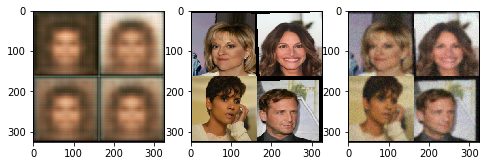

[0/2][600/2686]	Loss: 0.2640
[0/2][800/2686]	Loss: 0.2573
[0/2][1000/2686]	Loss: 0.2527


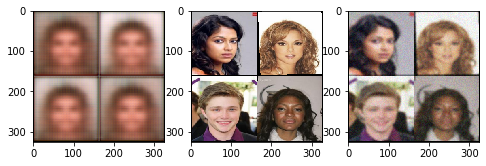

[0/2][1200/2686]	Loss: 0.2492
[0/2][1400/2686]	Loss: 0.2472


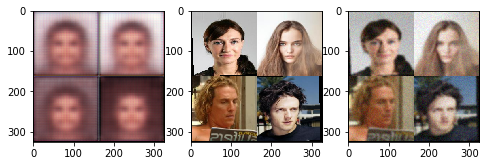

[0/2][1600/2686]	Loss: 0.2455
[0/2][1800/2686]	Loss: 0.2441
[0/2][2000/2686]	Loss: 0.2430


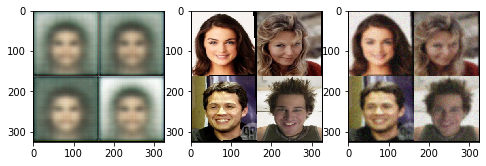

[0/2][2200/2686]	Loss: 0.2417
[0/2][2400/2686]	Loss: 0.2402


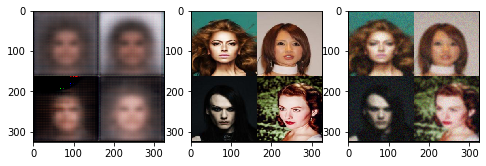

[0/2][2600/2686]	Loss: 0.2390
[0/2][2685/2686]	Loss: 0.2385
[0/2][2685/2686]	Tr Loss: 0.2385	Te Loss: 0.2589


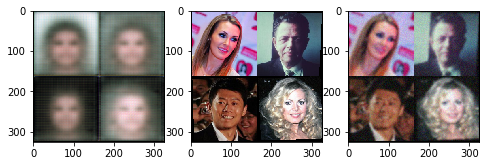

[1/2][0/2686]	Loss: 0.2300
[1/2][200/2686]	Loss: 0.2158
[1/2][400/2686]	Loss: 0.2159


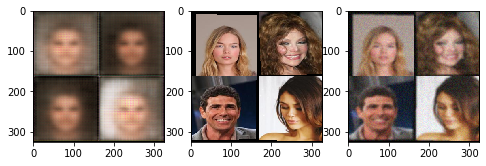

[1/2][600/2686]	Loss: 0.2137
[1/2][800/2686]	Loss: 0.2114
[1/2][1000/2686]	Loss: 0.2095


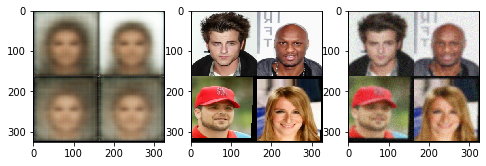

[1/2][1200/2686]	Loss: 0.2080
[1/2][1400/2686]	Loss: 0.2066


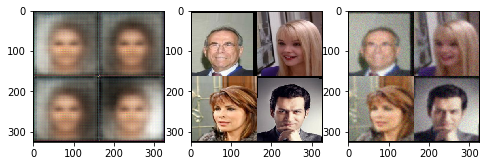

[1/2][1600/2686]	Loss: 0.2058
[1/2][1800/2686]	Loss: 0.2048
[1/2][2000/2686]	Loss: 0.2038


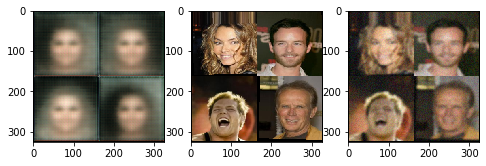

[1/2][2200/2686]	Loss: 0.2031
[1/2][2400/2686]	Loss: 0.2023


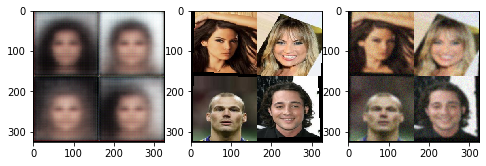

[1/2][2600/2686]	Loss: 0.2018
[1/2][2685/2686]	Loss: 0.2015
[1/2][2685/2686]	Tr Loss: 0.2015	Te Loss: 0.2349


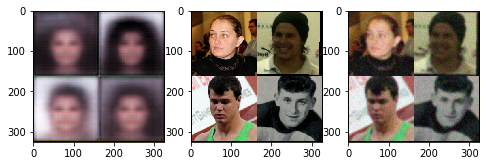

Copying file://./ae_noise_enc_4a.pt [Content-Type=application/octet-stream]...
|
Operation completed over 1 objects/126.1 MiB.                                    
Copying file://./ae_noise_dec_4a.pt [Content-Type=application/octet-stream]...
|
Operation completed over 1 objects/142.6 MiB.                                    
Copying file://./opt_ae_noise_4a.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on co

In [0]:
train(autoencoder, optimizer, train_loader=train_loader, test_loader=test_loader, n_epochs=2, plot_images=500)

[0/5][0/2686]	Loss: 0.1841
[0/5][200/2686]	Loss: 0.1905
[0/5][400/2686]	Loss: 0.1895
[0/5][600/2686]	Loss: 0.1891
[0/5][800/2686]	Loss: 0.1882
[0/5][1000/2686]	Loss: 0.1877
[0/5][1200/2686]	Loss: 0.1870
[0/5][1400/2686]	Loss: 0.1869


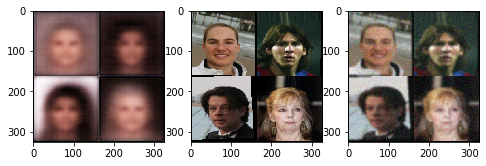

[0/5][1600/2686]	Loss: 0.1866
[0/5][1800/2686]	Loss: 0.1869
[0/5][2000/2686]	Loss: 0.1866
[0/5][2200/2686]	Loss: 0.1864
[0/5][2400/2686]	Loss: 0.1861
[0/5][2600/2686]	Loss: 0.1861
[0/5][2685/2686]	Loss: 0.1859
[0/5][2685/2686]	Tr Loss: 0.1859	Te Loss: 0.2199


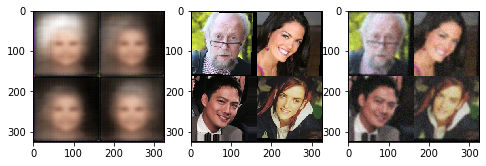

[1/5][0/2686]	Loss: 0.1767
[1/5][200/2686]	Loss: 0.1836
[1/5][400/2686]	Loss: 0.1849
[1/5][600/2686]	Loss: 0.1840
[1/5][800/2686]	Loss: 0.1842
[1/5][1000/2686]	Loss: 0.1845
[1/5][1200/2686]	Loss: 0.1845
[1/5][1400/2686]	Loss: 0.1841


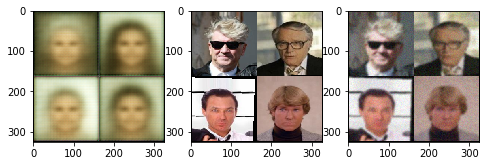

[1/5][1600/2686]	Loss: 0.1838
[1/5][1800/2686]	Loss: 0.1836
[1/5][2000/2686]	Loss: 0.1835
[1/5][2200/2686]	Loss: 0.1832
[1/5][2400/2686]	Loss: 0.1832
[1/5][2600/2686]	Loss: 0.1832
[1/5][2685/2686]	Loss: 0.1832
[1/5][2685/2686]	Tr Loss: 0.1832	Te Loss: 0.2276


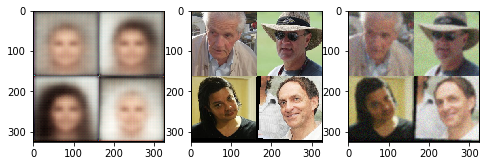

[2/5][0/2686]	Loss: 0.1895
[2/5][200/2686]	Loss: 0.1822
[2/5][400/2686]	Loss: 0.1825
[2/5][600/2686]	Loss: 0.1827
[2/5][800/2686]	Loss: 0.1826
[2/5][1000/2686]	Loss: 0.1825
[2/5][1200/2686]	Loss: 0.1825
[2/5][1400/2686]	Loss: 0.1828


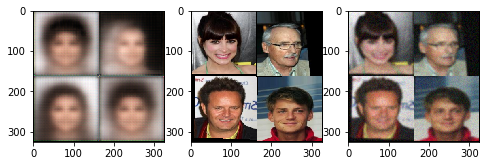

[2/5][1600/2686]	Loss: 0.1829
[2/5][1800/2686]	Loss: 0.1827
[2/5][2000/2686]	Loss: 0.1827
[2/5][2200/2686]	Loss: 0.1826
[2/5][2400/2686]	Loss: 0.1826
[2/5][2600/2686]	Loss: 0.1826
[2/5][2685/2686]	Loss: 0.1826
[2/5][2685/2686]	Tr Loss: 0.1826	Te Loss: 0.2138


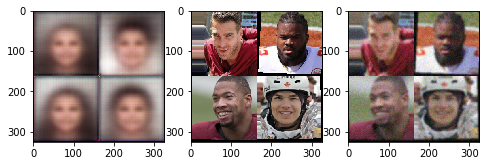

[3/5][0/2686]	Loss: 0.1542
[3/5][200/2686]	Loss: 0.1813
[3/5][400/2686]	Loss: 0.1818
[3/5][600/2686]	Loss: 0.1821
[3/5][800/2686]	Loss: 0.1818
[3/5][1000/2686]	Loss: 0.1817
[3/5][1200/2686]	Loss: 0.1816
[3/5][1400/2686]	Loss: 0.1815


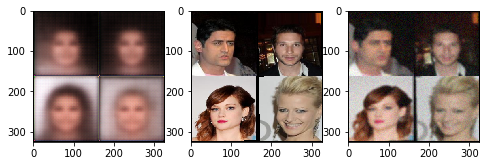

[3/5][1600/2686]	Loss: 0.1817
[3/5][1800/2686]	Loss: 0.1817
[3/5][2000/2686]	Loss: 0.1818
[3/5][2200/2686]	Loss: 0.1817
[3/5][2400/2686]	Loss: 0.1814
[3/5][2600/2686]	Loss: 0.1813
[3/5][2685/2686]	Loss: 0.1813
[3/5][2685/2686]	Tr Loss: 0.1813	Te Loss: 0.2195


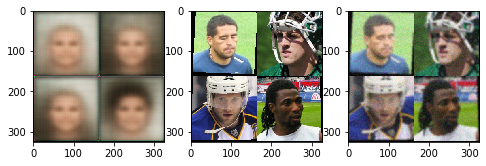

[4/5][0/2686]	Loss: 0.1782
[4/5][200/2686]	Loss: 0.1812
[4/5][400/2686]	Loss: 0.1805
[4/5][600/2686]	Loss: 0.1803
[4/5][800/2686]	Loss: 0.1806
[4/5][1000/2686]	Loss: 0.1807
[4/5][1200/2686]	Loss: 0.1806
[4/5][1400/2686]	Loss: 0.1808


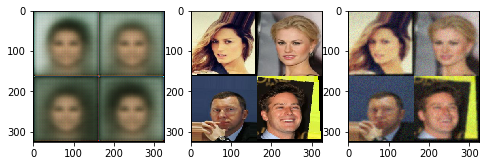

[4/5][1600/2686]	Loss: 0.1813
[4/5][1800/2686]	Loss: 0.1812
[4/5][2000/2686]	Loss: 0.1812
[4/5][2200/2686]	Loss: 0.1811
[4/5][2400/2686]	Loss: 0.1812
[4/5][2600/2686]	Loss: 0.1811
[4/5][2685/2686]	Loss: 0.1810
[4/5][2685/2686]	Tr Loss: 0.1810	Te Loss: 0.2147


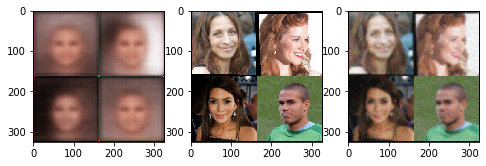

Copying file://./ae_noise_enc_4a.pt [Content-Type=application/octet-stream]...
|
Operation completed over 1 objects/126.1 MiB.                                    
Copying file://./ae_noise_dec_4a.pt [Content-Type=application/octet-stream]...
|
Operation completed over 1 objects/142.6 MiB.                                    
Copying file://./opt_ae_noise_4a.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on co

In [0]:
train(autoencoder, optimizer, train_loader=train_loader, test_loader=test_loader, n_epochs=5, plot_images=1500)

[0/10][0/2686]	Loss: 0.1850
[0/10][200/2686]	Loss: 0.1845
[0/10][400/2686]	Loss: 0.1843
[0/10][600/2686]	Loss: 0.1826
[0/10][800/2686]	Loss: 0.1816
[0/10][1000/2686]	Loss: 0.1807
[0/10][1200/2686]	Loss: 0.1798
[0/10][1400/2686]	Loss: 0.1794
[0/10][1600/2686]	Loss: 0.1795
[0/10][1800/2686]	Loss: 0.1790
[0/10][2000/2686]	Loss: 0.1785
[0/10][2200/2686]	Loss: 0.1781
[0/10][2400/2686]	Loss: 0.1776


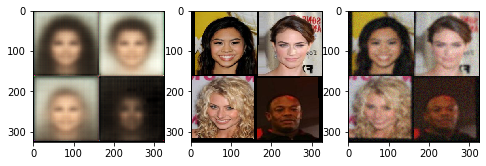

[0/10][2600/2686]	Loss: 0.1770
[0/10][2685/2686]	Loss: 0.1768
[0/10][2685/2686]	Tr Loss: 0.1768	Te Loss: 0.2083


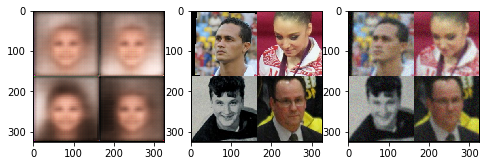

[1/10][0/2686]	Loss: 0.1684
[1/10][200/2686]	Loss: 0.1753
[1/10][400/2686]	Loss: 0.1760
[1/10][600/2686]	Loss: 0.1757
[1/10][800/2686]	Loss: 0.1746
[1/10][1000/2686]	Loss: 0.1735
[1/10][1200/2686]	Loss: 0.1732
[1/10][1400/2686]	Loss: 0.1729
[1/10][1600/2686]	Loss: 0.1721
[1/10][1800/2686]	Loss: 0.1711
[1/10][2000/2686]	Loss: 0.1705
[1/10][2200/2686]	Loss: 0.1699
[1/10][2400/2686]	Loss: 0.1694


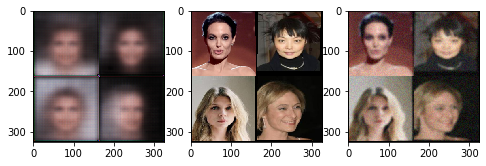

[1/10][2600/2686]	Loss: 0.1689
[1/10][2685/2686]	Loss: 0.1689
[1/10][2685/2686]	Tr Loss: 0.1689	Te Loss: 0.1996


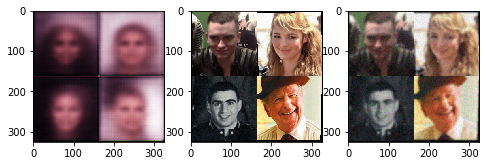

[2/10][0/2686]	Loss: 0.1690
[2/10][200/2686]	Loss: 0.1608
[2/10][400/2686]	Loss: 0.1612
[2/10][600/2686]	Loss: 0.1603
[2/10][800/2686]	Loss: 0.1605
[2/10][1000/2686]	Loss: 0.1616
[2/10][1200/2686]	Loss: 0.1615
[2/10][1400/2686]	Loss: 0.1620
[2/10][1600/2686]	Loss: 0.1623
[2/10][1800/2686]	Loss: 0.1621
[2/10][2000/2686]	Loss: 0.1617
[2/10][2200/2686]	Loss: 0.1614
[2/10][2400/2686]	Loss: 0.1614


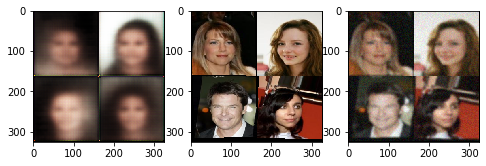

[2/10][2600/2686]	Loss: 0.1612
[2/10][2685/2686]	Loss: 0.1610
[2/10][2685/2686]	Tr Loss: 0.1610	Te Loss: 0.1981


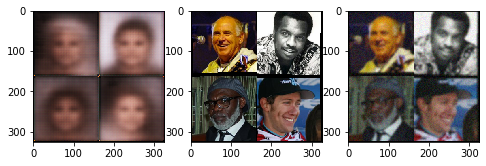

[3/10][0/2686]	Loss: 0.1520
[3/10][200/2686]	Loss: 0.1579
[3/10][400/2686]	Loss: 0.1572
[3/10][600/2686]	Loss: 0.1580
[3/10][800/2686]	Loss: 0.1579
[3/10][1000/2686]	Loss: 0.1581
[3/10][1200/2686]	Loss: 0.1584
[3/10][1400/2686]	Loss: 0.1583
[3/10][1600/2686]	Loss: 0.1581
[3/10][1800/2686]	Loss: 0.1582
[3/10][2000/2686]	Loss: 0.1587
[3/10][2200/2686]	Loss: 0.1589
[3/10][2400/2686]	Loss: 0.1589


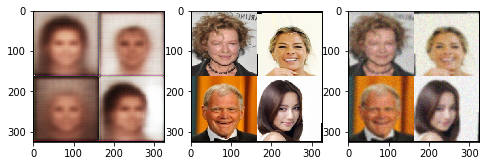

[3/10][2600/2686]	Loss: 0.1590
[3/10][2685/2686]	Loss: 0.1591
[3/10][2685/2686]	Tr Loss: 0.1591	Te Loss: 0.2015


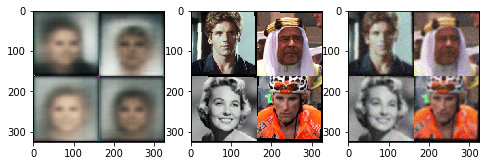

[4/10][0/2686]	Loss: 0.1604
[4/10][200/2686]	Loss: 0.1547
[4/10][400/2686]	Loss: 0.1556
[4/10][600/2686]	Loss: 0.1578
[4/10][800/2686]	Loss: 0.1591
[4/10][1000/2686]	Loss: 0.1587
[4/10][1200/2686]	Loss: 0.1585
[4/10][1400/2686]	Loss: 0.1584
[4/10][1600/2686]	Loss: 0.1577
[4/10][1800/2686]	Loss: 0.1577
[4/10][2000/2686]	Loss: 0.1576
[4/10][2200/2686]	Loss: 0.1572
[4/10][2400/2686]	Loss: 0.1570


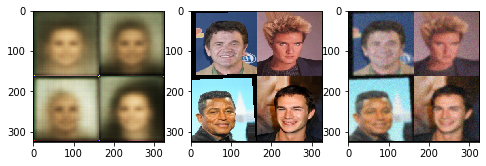

[4/10][2600/2686]	Loss: 0.1567
[4/10][2685/2686]	Loss: 0.1567
[4/10][2685/2686]	Tr Loss: 0.1567	Te Loss: 0.2217


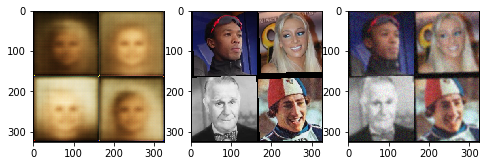

[5/10][0/2686]	Loss: 0.1700
[5/10][200/2686]	Loss: 0.1552
[5/10][400/2686]	Loss: 0.1547
[5/10][600/2686]	Loss: 0.1539
[5/10][800/2686]	Loss: 0.1544
[5/10][1000/2686]	Loss: 0.1542
[5/10][1200/2686]	Loss: 0.1545
[5/10][1400/2686]	Loss: 0.1540
[5/10][1600/2686]	Loss: 0.1534
[5/10][1800/2686]	Loss: 0.1535
[5/10][2000/2686]	Loss: 0.1532
[5/10][2200/2686]	Loss: 0.1528
[5/10][2400/2686]	Loss: 0.1528


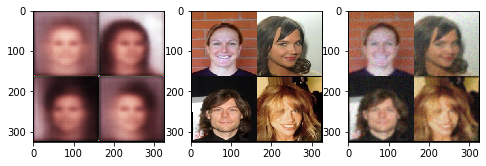

[5/10][2600/2686]	Loss: 0.1524
[5/10][2685/2686]	Loss: 0.1521
[5/10][2685/2686]	Tr Loss: 0.1521	Te Loss: 0.1980


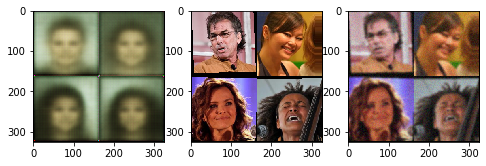

[6/10][0/2686]	Loss: 0.1472
[6/10][200/2686]	Loss: 0.1488
[6/10][400/2686]	Loss: 0.1483
[6/10][600/2686]	Loss: 0.1478
[6/10][800/2686]	Loss: 0.1476
[6/10][1000/2686]	Loss: 0.1473
[6/10][1200/2686]	Loss: 0.1472
[6/10][1400/2686]	Loss: 0.1471
[6/10][1600/2686]	Loss: 0.1470
[6/10][1800/2686]	Loss: 0.1468
[6/10][2000/2686]	Loss: 0.1464
[6/10][2200/2686]	Loss: 0.1463
[6/10][2400/2686]	Loss: 0.1461


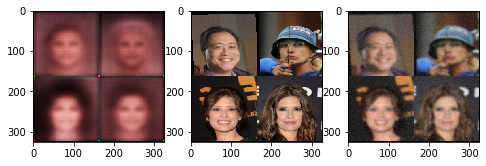

[6/10][2600/2686]	Loss: 0.1460
[6/10][2685/2686]	Loss: 0.1460
[6/10][2685/2686]	Tr Loss: 0.1460	Te Loss: 0.1876


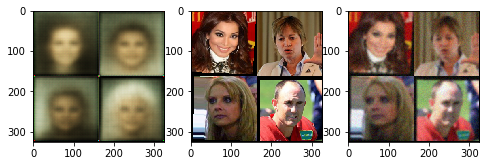

[7/10][0/2686]	Loss: 0.1394
[7/10][200/2686]	Loss: 0.1439
[7/10][400/2686]	Loss: 0.1428
[7/10][600/2686]	Loss: 0.1432
[7/10][800/2686]	Loss: 0.1425
[7/10][1000/2686]	Loss: 0.1420
[7/10][1200/2686]	Loss: 0.1427
[7/10][1400/2686]	Loss: 0.1427
[7/10][1600/2686]	Loss: 0.1425
[7/10][1800/2686]	Loss: 0.1425
[7/10][2000/2686]	Loss: 0.1424
[7/10][2200/2686]	Loss: 0.1422
[7/10][2400/2686]	Loss: 0.1420


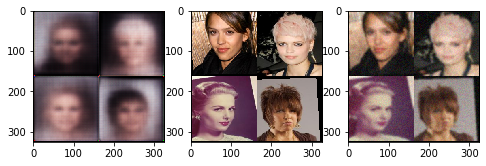

[7/10][2600/2686]	Loss: 0.1418
[7/10][2685/2686]	Loss: 0.1418
[7/10][2685/2686]	Tr Loss: 0.1418	Te Loss: 0.1743


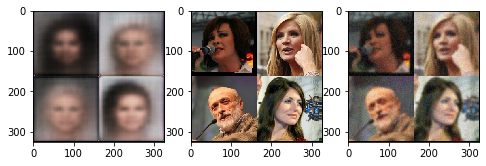

[8/10][0/2686]	Loss: 0.1340
[8/10][200/2686]	Loss: 0.1371
[8/10][400/2686]	Loss: 0.1364
[8/10][600/2686]	Loss: 0.1360
[8/10][800/2686]	Loss: 0.1361
[8/10][1000/2686]	Loss: 0.1361
[8/10][1200/2686]	Loss: 0.1361
[8/10][1400/2686]	Loss: 0.1359
[8/10][1600/2686]	Loss: 0.1358
[8/10][1800/2686]	Loss: 0.1358
[8/10][2000/2686]	Loss: 0.1358
[8/10][2200/2686]	Loss: 0.1358
[8/10][2400/2686]	Loss: 0.1357


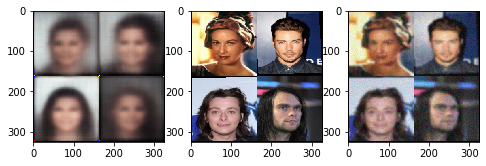

[8/10][2600/2686]	Loss: 0.1354
[8/10][2685/2686]	Loss: 0.1353
[8/10][2685/2686]	Tr Loss: 0.1353	Te Loss: 0.1728


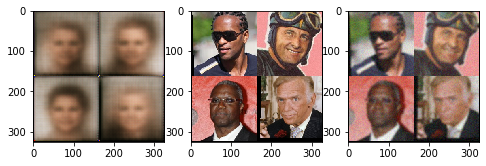

[9/10][0/2686]	Loss: 0.1330
[9/10][200/2686]	Loss: 0.1313
[9/10][400/2686]	Loss: 0.1323
[9/10][600/2686]	Loss: 0.1323
[9/10][800/2686]	Loss: 0.1323
[9/10][1000/2686]	Loss: 0.1322
[9/10][1200/2686]	Loss: 0.1322
[9/10][1400/2686]	Loss: 0.1325
[9/10][1600/2686]	Loss: 0.1322
[9/10][1800/2686]	Loss: 0.1320
[9/10][2000/2686]	Loss: 0.1316
[9/10][2200/2686]	Loss: 0.1314
[9/10][2400/2686]	Loss: 0.1313


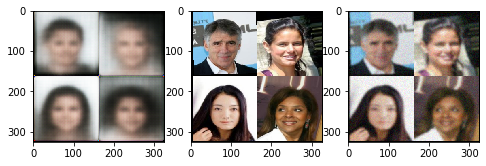

[9/10][2600/2686]	Loss: 0.1313
[9/10][2685/2686]	Loss: 0.1313
[9/10][2685/2686]	Tr Loss: 0.1313	Te Loss: 0.1672


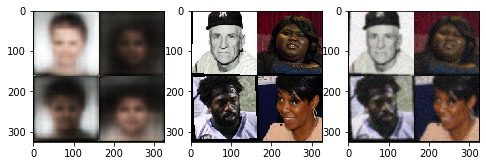

Copying file://./ae_noise_enc_4a.pt [Content-Type=application/octet-stream]...
/
Operation completed over 1 objects/126.1 MiB.                                    
Copying file://./ae_noise_dec_4a.pt [Content-Type=application/octet-stream]...
|
Operation completed over 1 objects/142.6 MiB.                                    
Copying file://./opt_ae_noise_4a.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on co

In [0]:
train(autoencoder, optimizer, train_loader=train_loader, test_loader=test_loader, n_epochs=10, plot_images=2500)

[0/10][0/2686]	Loss: 0.0876
[0/10][200/2686]	Loss: 0.1065
[0/10][400/2686]	Loss: 0.1054
[0/10][600/2686]	Loss: 0.1036
[0/10][800/2686]	Loss: 0.1020
[0/10][1000/2686]	Loss: 0.1000
[0/10][1200/2686]	Loss: 0.0989
[0/10][1400/2686]	Loss: 0.0980


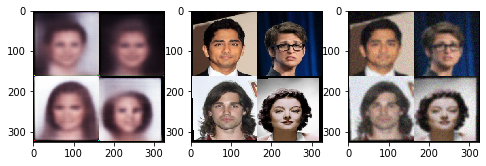

[0/10][1600/2686]	Loss: 0.0973
[0/10][1800/2686]	Loss: 0.0966
[0/10][2000/2686]	Loss: 0.0961
[0/10][2200/2686]	Loss: 0.0956
[0/10][2400/2686]	Loss: 0.0952
[0/10][2600/2686]	Loss: 0.0949
[0/10][2685/2686]	Loss: 0.0947
[0/10][2685/2686]	Tr Loss: 0.0947	Te Loss: 0.1288


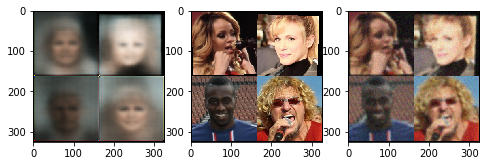

[1/10][0/2686]	Loss: 0.0935
[1/10][200/2686]	Loss: 0.0917
[1/10][400/2686]	Loss: 0.0927
[1/10][600/2686]	Loss: 0.0928
[1/10][800/2686]	Loss: 0.0926
[1/10][1000/2686]	Loss: 0.0925
[1/10][1200/2686]	Loss: 0.0923
[1/10][1400/2686]	Loss: 0.0924


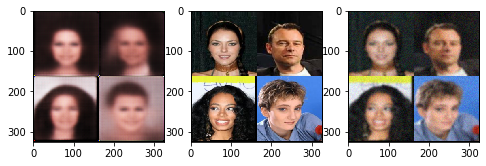

[1/10][1600/2686]	Loss: 0.0922
[1/10][1800/2686]	Loss: 0.0923
[1/10][2000/2686]	Loss: 0.0923
[1/10][2200/2686]	Loss: 0.0922
[1/10][2400/2686]	Loss: 0.0922
[1/10][2600/2686]	Loss: 0.0921
[1/10][2685/2686]	Loss: 0.0921
[1/10][2685/2686]	Tr Loss: 0.0921	Te Loss: 0.1328


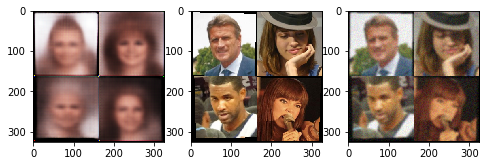

[2/10][0/2686]	Loss: 0.0907
[2/10][200/2686]	Loss: 0.0903
[2/10][400/2686]	Loss: 0.0920
[2/10][600/2686]	Loss: 0.0932
[2/10][800/2686]	Loss: 0.0933
[2/10][1000/2686]	Loss: 0.0936
[2/10][1200/2686]	Loss: 0.0937
[2/10][1400/2686]	Loss: 0.0938


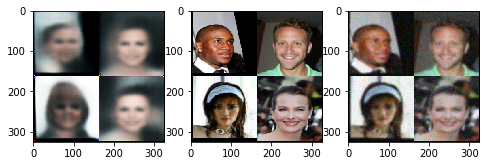

[2/10][1600/2686]	Loss: 0.0941
[2/10][1800/2686]	Loss: 0.0944
[2/10][2000/2686]	Loss: 0.0951
[2/10][2200/2686]	Loss: 0.0955
[2/10][2400/2686]	Loss: 0.0956
[2/10][2600/2686]	Loss: 0.0955
[2/10][2685/2686]	Loss: 0.0954
[2/10][2685/2686]	Tr Loss: 0.0954	Te Loss: 0.1443


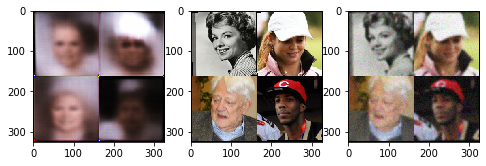

[3/10][0/2686]	Loss: 0.0967
[3/10][200/2686]	Loss: 0.0909
[3/10][400/2686]	Loss: 0.0905
[3/10][600/2686]	Loss: 0.0903
[3/10][800/2686]	Loss: 0.0907
[3/10][1000/2686]	Loss: 0.0906
[3/10][1200/2686]	Loss: 0.0908
[3/10][1400/2686]	Loss: 0.0907


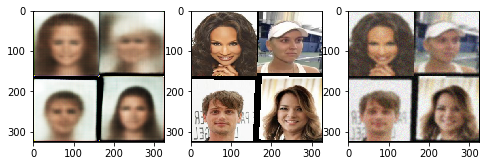

[3/10][1600/2686]	Loss: 0.0906
[3/10][1800/2686]	Loss: 0.0904
[3/10][2000/2686]	Loss: 0.0902
[3/10][2200/2686]	Loss: 0.0901
[3/10][2400/2686]	Loss: 0.0900
[3/10][2600/2686]	Loss: 0.0899
[3/10][2685/2686]	Loss: 0.0899
[3/10][2685/2686]	Tr Loss: 0.0899	Te Loss: 0.1335


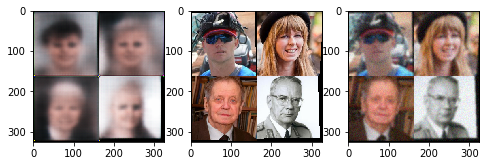

[4/10][0/2686]	Loss: 0.0866
[4/10][200/2686]	Loss: 0.0891
[4/10][400/2686]	Loss: 0.0891
[4/10][600/2686]	Loss: 0.0881
[4/10][800/2686]	Loss: 0.0878
[4/10][1000/2686]	Loss: 0.0882
[4/10][1200/2686]	Loss: 0.0883
[4/10][1400/2686]	Loss: 0.0882


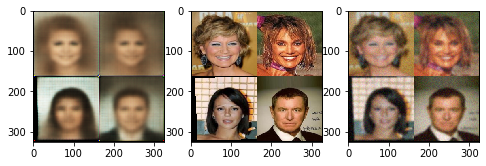

[4/10][1600/2686]	Loss: 0.0881
[4/10][1800/2686]	Loss: 0.0880
[4/10][2000/2686]	Loss: 0.0880
[4/10][2200/2686]	Loss: 0.0879
[4/10][2400/2686]	Loss: 0.0878
[4/10][2600/2686]	Loss: 0.0879
[4/10][2685/2686]	Loss: 0.0880
[4/10][2685/2686]	Tr Loss: 0.0880	Te Loss: 0.1280


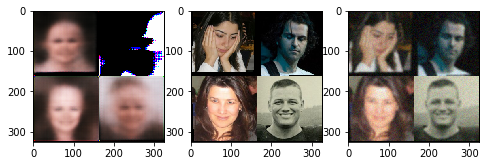

[5/10][0/2686]	Loss: 0.0791
[5/10][200/2686]	Loss: 0.0889
[5/10][400/2686]	Loss: 0.0891
[5/10][600/2686]	Loss: 0.0890
[5/10][800/2686]	Loss: 0.0886
[5/10][1000/2686]	Loss: 0.0885
[5/10][1200/2686]	Loss: 0.0885
[5/10][1400/2686]	Loss: 0.0880


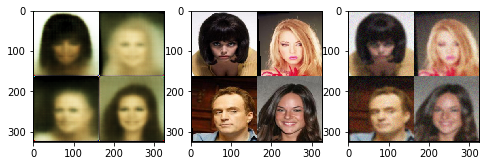

[5/10][1600/2686]	Loss: 0.0881
[5/10][1800/2686]	Loss: 0.0879
[5/10][2000/2686]	Loss: 0.0879
[5/10][2200/2686]	Loss: 0.0879
[5/10][2400/2686]	Loss: 0.0879
[5/10][2600/2686]	Loss: 0.0878
[5/10][2685/2686]	Loss: 0.0877
[5/10][2685/2686]	Tr Loss: 0.0877	Te Loss: 0.1288


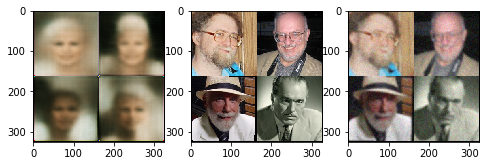

[6/10][0/2686]	Loss: 0.0844
[6/10][200/2686]	Loss: 0.0857
[6/10][400/2686]	Loss: 0.0864
[6/10][600/2686]	Loss: 0.0866
[6/10][800/2686]	Loss: 0.0870
[6/10][1000/2686]	Loss: 0.0870
[6/10][1200/2686]	Loss: 0.0869
[6/10][1400/2686]	Loss: 0.0866


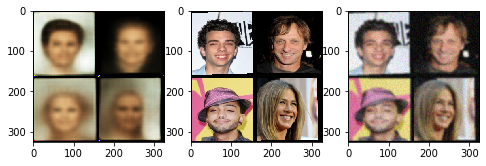

[6/10][1600/2686]	Loss: 0.0866
[6/10][1800/2686]	Loss: 0.0866
[6/10][2000/2686]	Loss: 0.0863
[6/10][2200/2686]	Loss: 0.0862
[6/10][2400/2686]	Loss: 0.0861
[6/10][2600/2686]	Loss: 0.0860
[6/10][2685/2686]	Loss: 0.0860
[6/10][2685/2686]	Tr Loss: 0.0860	Te Loss: 0.1288


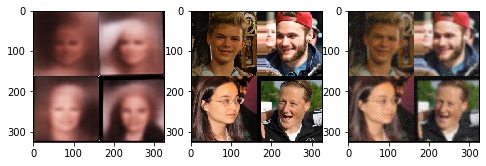

[7/10][0/2686]	Loss: 0.0913
[7/10][200/2686]	Loss: 0.0854
[7/10][400/2686]	Loss: 0.0857
[7/10][600/2686]	Loss: 0.0855
[7/10][800/2686]	Loss: 0.0855
[7/10][1000/2686]	Loss: 0.0853
[7/10][1200/2686]	Loss: 0.0851
[7/10][1400/2686]	Loss: 0.0853


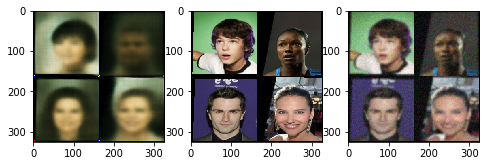

[7/10][1600/2686]	Loss: 0.0852
[7/10][1800/2686]	Loss: 0.0851
[7/10][2000/2686]	Loss: 0.0850
[7/10][2200/2686]	Loss: 0.0849
[7/10][2400/2686]	Loss: 0.0849
[7/10][2600/2686]	Loss: 0.0848
[7/10][2685/2686]	Loss: 0.0848
[7/10][2685/2686]	Tr Loss: 0.0848	Te Loss: 0.1310


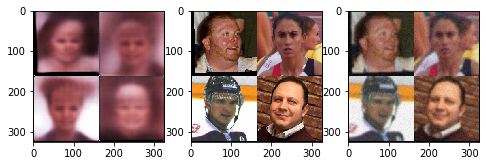

[8/10][0/2686]	Loss: 0.0957
[8/10][200/2686]	Loss: 0.0837
[8/10][400/2686]	Loss: 0.0842
[8/10][600/2686]	Loss: 0.0842
[8/10][800/2686]	Loss: 0.0843
[8/10][1000/2686]	Loss: 0.0843
[8/10][1200/2686]	Loss: 0.0841
[8/10][1400/2686]	Loss: 0.0840


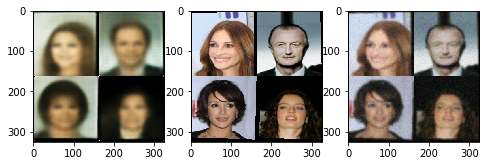

[8/10][1600/2686]	Loss: 0.0839
[8/10][1800/2686]	Loss: 0.0838
[8/10][2000/2686]	Loss: 0.0836
[8/10][2200/2686]	Loss: 0.0835
[8/10][2400/2686]	Loss: 0.0835
[8/10][2600/2686]	Loss: 0.0835
[8/10][2685/2686]	Loss: 0.0835
[8/10][2685/2686]	Tr Loss: 0.0835	Te Loss: 0.1286


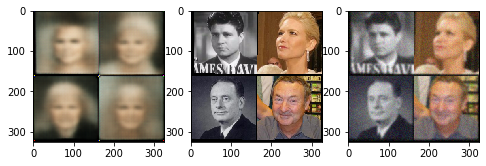

[9/10][0/2686]	Loss: 0.0892
[9/10][200/2686]	Loss: 0.0823
[9/10][400/2686]	Loss: 0.0823
[9/10][600/2686]	Loss: 0.0822
[9/10][800/2686]	Loss: 0.0822
[9/10][1000/2686]	Loss: 0.0826
[9/10][1200/2686]	Loss: 0.0824
[9/10][1400/2686]	Loss: 0.0824


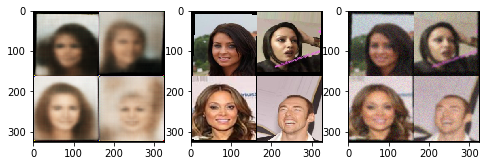

[9/10][1600/2686]	Loss: 0.0825
[9/10][1800/2686]	Loss: 0.0825
[9/10][2000/2686]	Loss: 0.0827
[9/10][2200/2686]	Loss: 0.0826
[9/10][2400/2686]	Loss: 0.0826
[9/10][2600/2686]	Loss: 0.0826
[9/10][2685/2686]	Loss: 0.0825
[9/10][2685/2686]	Tr Loss: 0.0825	Te Loss: 0.1248


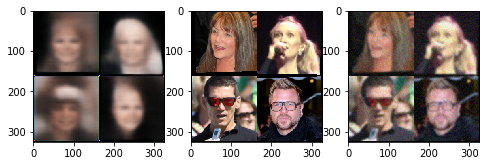

Copying file://./ae_noise_enc_4a.pt [Content-Type=application/octet-stream]...
\
Operation completed over 1 objects/126.1 MiB.                                    
Copying file://./ae_noise_dec_4a.pt [Content-Type=application/octet-stream]...
|
Operation completed over 1 objects/142.6 MiB.                                    
Copying file://./opt_ae_noise_4a.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on co

In [0]:
train(autoencoder, optimizer, train_loader=train_loader, test_loader=test_loader, n_epochs=10, plot_images=1500)

[0/10][0/4052]	Loss: 0.05659
[0/10][200/4052]	Loss: 0.05742
[0/10][400/4052]	Loss: 0.05739
[0/10][600/4052]	Loss: 0.05744
[0/10][800/4052]	Loss: 0.05740
[0/10][1000/4052]	Loss: 0.05745
[0/10][1200/4052]	Loss: 0.05738
[0/10][1400/4052]	Loss: 0.05736
[0/10][1600/4052]	Loss: 0.05739
[0/10][1800/4052]	Loss: 0.05737
[0/10][2000/4052]	Loss: 0.05737


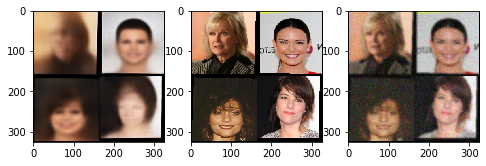

[0/10][2200/4052]	Loss: 0.05739
[0/10][2400/4052]	Loss: 0.05741
[0/10][2600/4052]	Loss: 0.05741
[0/10][2800/4052]	Loss: 0.05740
[0/10][3000/4052]	Loss: 0.05738
[0/10][3200/4052]	Loss: 0.05739
[0/10][3400/4052]	Loss: 0.05737
[0/10][3600/4052]	Loss: 0.05737
[0/10][3800/4052]	Loss: 0.05737
[0/10][4000/4052]	Loss: 0.05735


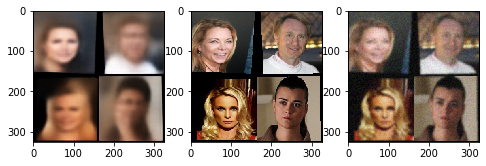

[0/10][4051/4052]	Loss: 0.05734
[0/10][4051/4052]	Tr Loss: 0.05734	Te Loss: 0.08572


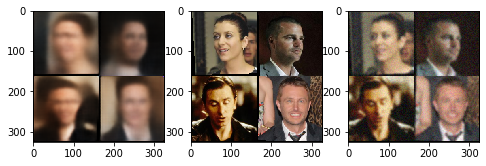

[1/10][0/4052]	Loss: 0.05500
[1/10][200/4052]	Loss: 0.05722
[1/10][400/4052]	Loss: 0.05737
[1/10][600/4052]	Loss: 0.05750
[1/10][800/4052]	Loss: 0.05749
[1/10][1000/4052]	Loss: 0.05748
[1/10][1200/4052]	Loss: 0.05747
[1/10][1400/4052]	Loss: 0.05749
[1/10][1600/4052]	Loss: 0.05743
[1/10][1800/4052]	Loss: 0.05738
[1/10][2000/4052]	Loss: 0.05733


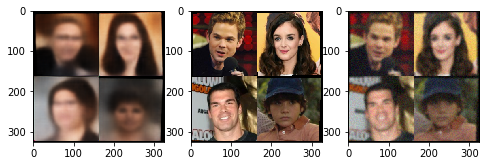

[1/10][2200/4052]	Loss: 0.05728
[1/10][2400/4052]	Loss: 0.05728
[1/10][2600/4052]	Loss: 0.05727
[1/10][2800/4052]	Loss: 0.05727
[1/10][3000/4052]	Loss: 0.05725
[1/10][3200/4052]	Loss: 0.05723
[1/10][3400/4052]	Loss: 0.05724
[1/10][3600/4052]	Loss: 0.05724
[1/10][3800/4052]	Loss: 0.05726
[1/10][4000/4052]	Loss: 0.05727


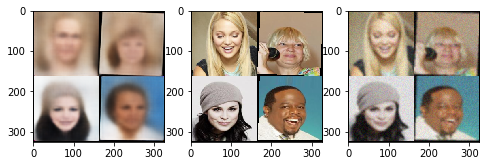

[1/10][4051/4052]	Loss: 0.05727
[1/10][4051/4052]	Tr Loss: 0.05727	Te Loss: 0.07566


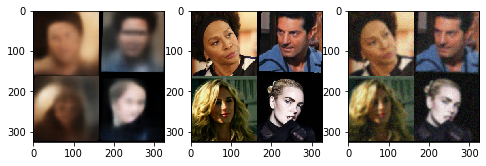

[2/10][0/4052]	Loss: 0.05571
[2/10][200/4052]	Loss: 0.05731
[2/10][400/4052]	Loss: 0.05717
[2/10][600/4052]	Loss: 0.05717
[2/10][800/4052]	Loss: 0.05718
[2/10][1000/4052]	Loss: 0.05718
[2/10][1200/4052]	Loss: 0.05715
[2/10][1400/4052]	Loss: 0.05713
[2/10][1600/4052]	Loss: 0.05718
[2/10][1800/4052]	Loss: 0.05715
[2/10][2000/4052]	Loss: 0.05715


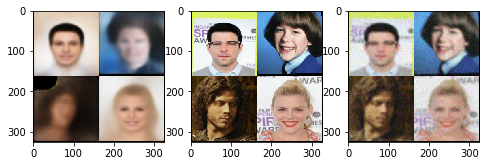

[2/10][2200/4052]	Loss: 0.05715
[2/10][2400/4052]	Loss: 0.05718
[2/10][2600/4052]	Loss: 0.05720
[2/10][2800/4052]	Loss: 0.05721
[2/10][3000/4052]	Loss: 0.05723
[2/10][3200/4052]	Loss: 0.05721
[2/10][3400/4052]	Loss: 0.05719
[2/10][3600/4052]	Loss: 0.05719
[2/10][3800/4052]	Loss: 0.05718
[2/10][4000/4052]	Loss: 0.05718


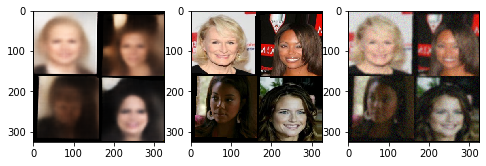

[2/10][4051/4052]	Loss: 0.05719
[2/10][4051/4052]	Tr Loss: 0.05719	Te Loss: 0.09030


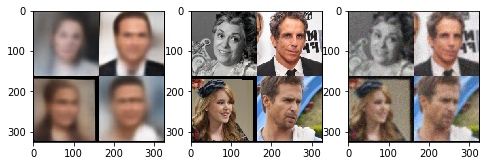

[3/10][0/4052]	Loss: 0.05360
[3/10][200/4052]	Loss: 0.05720
[3/10][400/4052]	Loss: 0.05706
[3/10][600/4052]	Loss: 0.05719
[3/10][800/4052]	Loss: 0.05716
[3/10][1000/4052]	Loss: 0.05714
[3/10][1200/4052]	Loss: 0.05719
[3/10][1400/4052]	Loss: 0.05718
[3/10][1600/4052]	Loss: 0.05715
[3/10][1800/4052]	Loss: 0.05717
[3/10][2000/4052]	Loss: 0.05718


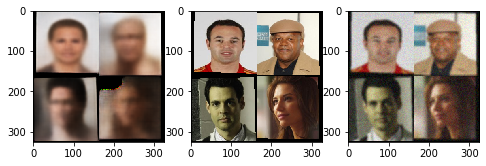

[3/10][2200/4052]	Loss: 0.05717
[3/10][2400/4052]	Loss: 0.05716
[3/10][2600/4052]	Loss: 0.05716
[3/10][2800/4052]	Loss: 0.05715
[3/10][3000/4052]	Loss: 0.05716
[3/10][3200/4052]	Loss: 0.05716
[3/10][3400/4052]	Loss: 0.05717
[3/10][3600/4052]	Loss: 0.05717
[3/10][3800/4052]	Loss: 0.05716
[3/10][4000/4052]	Loss: 0.05715


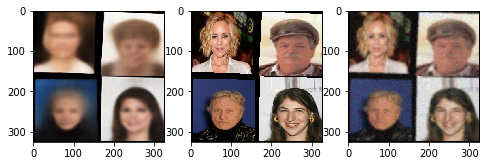

[3/10][4051/4052]	Loss: 0.05715
[3/10][4051/4052]	Tr Loss: 0.05715	Te Loss: 0.07753


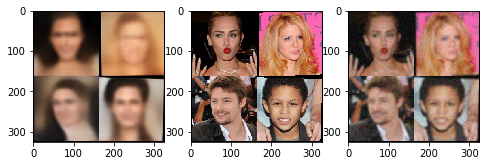

[4/10][0/4052]	Loss: 0.05998
[4/10][200/4052]	Loss: 0.05705
[4/10][400/4052]	Loss: 0.05692
[4/10][600/4052]	Loss: 0.05711
[4/10][800/4052]	Loss: 0.05713
[4/10][1000/4052]	Loss: 0.05717
[4/10][1200/4052]	Loss: 0.05719
[4/10][1400/4052]	Loss: 0.05712
[4/10][1600/4052]	Loss: 0.05708
[4/10][1800/4052]	Loss: 0.05706
[4/10][2000/4052]	Loss: 0.05707


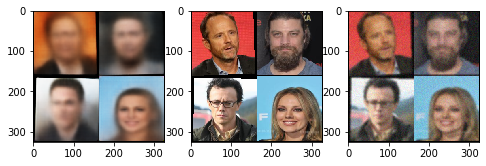

[4/10][2200/4052]	Loss: 0.05709
[4/10][2400/4052]	Loss: 0.05710
[4/10][2600/4052]	Loss: 0.05712
[4/10][2800/4052]	Loss: 0.05713
[4/10][3000/4052]	Loss: 0.05715
[4/10][3200/4052]	Loss: 0.05718
[4/10][3400/4052]	Loss: 0.05715
[4/10][3600/4052]	Loss: 0.05713
[4/10][3800/4052]	Loss: 0.05712
[4/10][4000/4052]	Loss: 0.05711


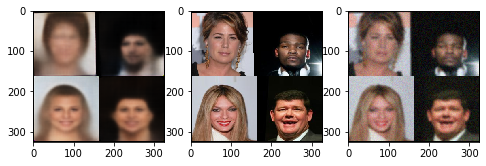

[4/10][4051/4052]	Loss: 0.05711
[4/10][4051/4052]	Tr Loss: 0.05711	Te Loss: 0.08606


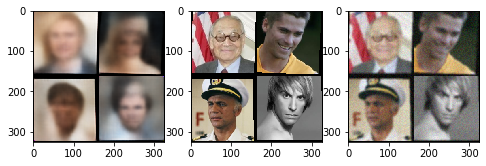

[5/10][0/4052]	Loss: 0.06484
[5/10][200/4052]	Loss: 0.05681
[5/10][400/4052]	Loss: 0.05699
[5/10][600/4052]	Loss: 0.05713
[5/10][800/4052]	Loss: 0.05707
[5/10][1000/4052]	Loss: 0.05712
[5/10][1200/4052]	Loss: 0.05708
[5/10][1400/4052]	Loss: 0.05707
[5/10][1600/4052]	Loss: 0.05708
[5/10][1800/4052]	Loss: 0.05708
[5/10][2000/4052]	Loss: 0.05709


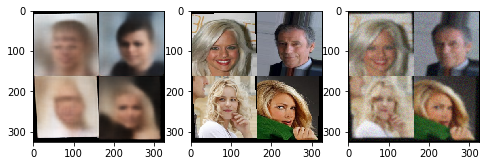

[5/10][2200/4052]	Loss: 0.05710
[5/10][2400/4052]	Loss: 0.05711
[5/10][2600/4052]	Loss: 0.05710
[5/10][2800/4052]	Loss: 0.05709
[5/10][3000/4052]	Loss: 0.05708
[5/10][3200/4052]	Loss: 0.05709
[5/10][3400/4052]	Loss: 0.05710
[5/10][3600/4052]	Loss: 0.05709
[5/10][3800/4052]	Loss: 0.05709
[5/10][4000/4052]	Loss: 0.05708


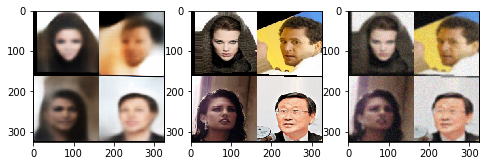

[5/10][4051/4052]	Loss: 0.05708
[5/10][4051/4052]	Tr Loss: 0.05708	Te Loss: 0.08308


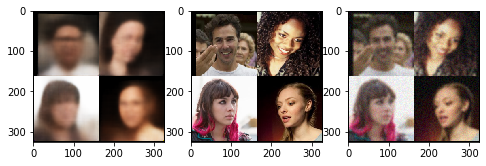

[6/10][0/4052]	Loss: 0.05758
[6/10][200/4052]	Loss: 0.05707
[6/10][400/4052]	Loss: 0.05697
[6/10][600/4052]	Loss: 0.05708
[6/10][800/4052]	Loss: 0.05701
[6/10][1000/4052]	Loss: 0.05698
[6/10][1200/4052]	Loss: 0.05702
[6/10][1400/4052]	Loss: 0.05703
[6/10][1600/4052]	Loss: 0.05705
[6/10][1800/4052]	Loss: 0.05701
[6/10][2000/4052]	Loss: 0.05696


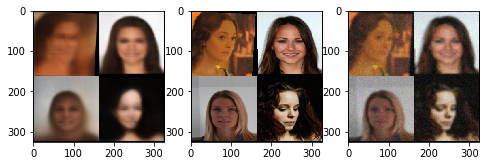

[6/10][2200/4052]	Loss: 0.05697
[6/10][2400/4052]	Loss: 0.05695
[6/10][2600/4052]	Loss: 0.05695
[6/10][2800/4052]	Loss: 0.05697
[6/10][3000/4052]	Loss: 0.05699
[6/10][3200/4052]	Loss: 0.05700
[6/10][3400/4052]	Loss: 0.05701
[6/10][3600/4052]	Loss: 0.05701
[6/10][3800/4052]	Loss: 0.05702
[6/10][4000/4052]	Loss: 0.05701


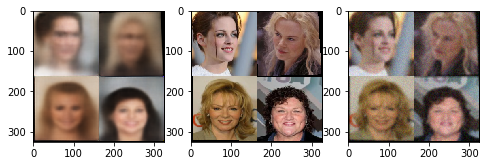

[6/10][4051/4052]	Loss: 0.05701
[6/10][4051/4052]	Tr Loss: 0.05701	Te Loss: 0.08465


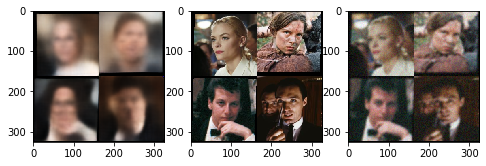

[7/10][0/4052]	Loss: 0.05800
[7/10][200/4052]	Loss: 0.05686
[7/10][400/4052]	Loss: 0.05707
[7/10][600/4052]	Loss: 0.05676
[7/10][800/4052]	Loss: 0.05683
[7/10][1000/4052]	Loss: 0.05681
[7/10][1200/4052]	Loss: 0.05685
[7/10][1400/4052]	Loss: 0.05689
[7/10][1600/4052]	Loss: 0.05690
[7/10][1800/4052]	Loss: 0.05695
[7/10][2000/4052]	Loss: 0.05696


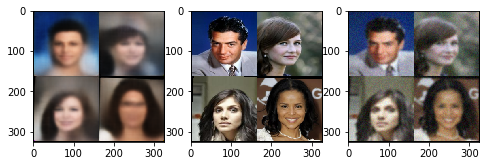

[7/10][2200/4052]	Loss: 0.05698
[7/10][2400/4052]	Loss: 0.05698
[7/10][2600/4052]	Loss: 0.05699
[7/10][2800/4052]	Loss: 0.05699
[7/10][3000/4052]	Loss: 0.05698
[7/10][3200/4052]	Loss: 0.05698
[7/10][3400/4052]	Loss: 0.05698
[7/10][3600/4052]	Loss: 0.05697
[7/10][3800/4052]	Loss: 0.05698
[7/10][4000/4052]	Loss: 0.05696


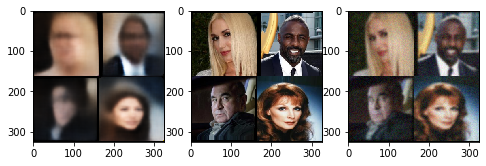

[7/10][4051/4052]	Loss: 0.05696
[7/10][4051/4052]	Tr Loss: 0.05696	Te Loss: 0.08580


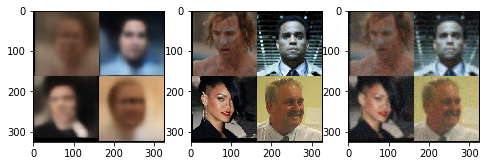

[8/10][0/4052]	Loss: 0.05476
[8/10][200/4052]	Loss: 0.05725
[8/10][400/4052]	Loss: 0.05686
[8/10][600/4052]	Loss: 0.05698
[8/10][800/4052]	Loss: 0.05696
[8/10][1000/4052]	Loss: 0.05701
[8/10][1200/4052]	Loss: 0.05698
[8/10][1400/4052]	Loss: 0.05695
[8/10][1600/4052]	Loss: 0.05696
[8/10][1800/4052]	Loss: 0.05692
[8/10][2000/4052]	Loss: 0.05690


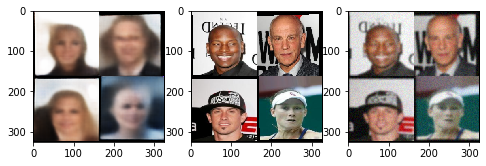

[8/10][2200/4052]	Loss: 0.05695
[8/10][2400/4052]	Loss: 0.05699
[8/10][2600/4052]	Loss: 0.05701
[8/10][2800/4052]	Loss: 0.05702
[8/10][3000/4052]	Loss: 0.05702
[8/10][3200/4052]	Loss: 0.05699
[8/10][3400/4052]	Loss: 0.05698
[8/10][3600/4052]	Loss: 0.05697
[8/10][3800/4052]	Loss: 0.05695
[8/10][4000/4052]	Loss: 0.05697


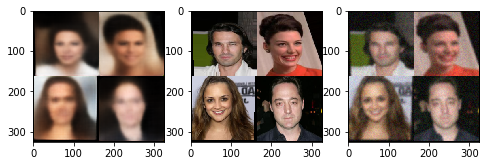

[8/10][4051/4052]	Loss: 0.05697
[8/10][4051/4052]	Tr Loss: 0.05697	Te Loss: 0.08448


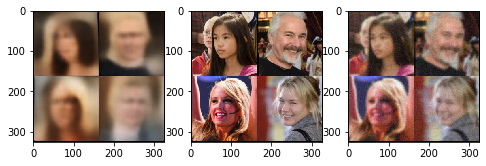

[9/10][0/4052]	Loss: 0.05540
[9/10][200/4052]	Loss: 0.05728
[9/10][400/4052]	Loss: 0.05731
[9/10][600/4052]	Loss: 0.05723
[9/10][800/4052]	Loss: 0.05701
[9/10][1000/4052]	Loss: 0.05700
[9/10][1200/4052]	Loss: 0.05700
[9/10][1400/4052]	Loss: 0.05700
[9/10][1600/4052]	Loss: 0.05699
[9/10][1800/4052]	Loss: 0.05695
[9/10][2000/4052]	Loss: 0.05695


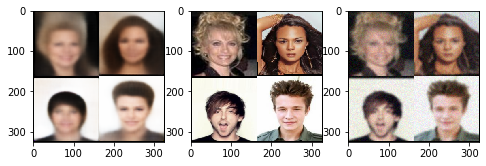

[9/10][2200/4052]	Loss: 0.05695
[9/10][2400/4052]	Loss: 0.05697
[9/10][2600/4052]	Loss: 0.05695
[9/10][2800/4052]	Loss: 0.05695
[9/10][3000/4052]	Loss: 0.05695
[9/10][3200/4052]	Loss: 0.05693
[9/10][3400/4052]	Loss: 0.05695
[9/10][3600/4052]	Loss: 0.05695
[9/10][3800/4052]	Loss: 0.05697
[9/10][4000/4052]	Loss: 0.05696


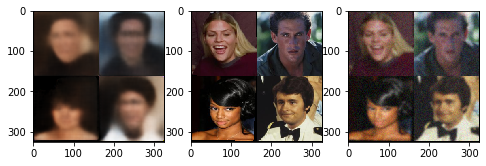

[9/10][4051/4052]	Loss: 0.05696
[9/10][4051/4052]	Tr Loss: 0.05696	Te Loss: 0.08621


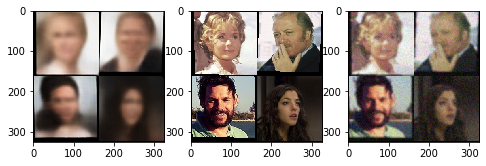

Copying file://./ae_noise_enc_4a.pt [Content-Type=application/octet-stream]...
|
Operation completed over 1 objects/126.1 MiB.                                    
Copying file://./ae_noise_dec_4a.pt [Content-Type=application/octet-stream]...
\
Operation completed over 1 objects/142.6 MiB.                                    
Copying file://./opt_ae_noise_4a.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on co

In [0]:
train(autoencoder, optimizer, train_loader=train_loader, test_loader=test_loader, n_epochs=10, plot_images=2000)

[0/10][0/4052]	Loss: 0.05321
[0/10][200/4052]	Loss: 0.05687
[0/10][400/4052]	Loss: 0.05697
[0/10][600/4052]	Loss: 0.05702
[0/10][800/4052]	Loss: 0.05700
[0/10][1000/4052]	Loss: 0.05706
[0/10][1200/4052]	Loss: 0.05705
[0/10][1400/4052]	Loss: 0.05706


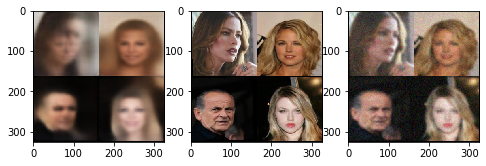

[0/10][1600/4052]	Loss: 0.05707
[0/10][1800/4052]	Loss: 0.05707
[0/10][2000/4052]	Loss: 0.05705
[0/10][2200/4052]	Loss: 0.05703
[0/10][2400/4052]	Loss: 0.05703
[0/10][2600/4052]	Loss: 0.05701
[0/10][2800/4052]	Loss: 0.05702
[0/10][3000/4052]	Loss: 0.05701


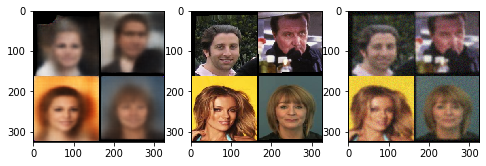

[0/10][3200/4052]	Loss: 0.05701
[0/10][3400/4052]	Loss: 0.05699
[0/10][3600/4052]	Loss: 0.05698
[0/10][3800/4052]	Loss: 0.05696
[0/10][4000/4052]	Loss: 0.05695
[0/10][4051/4052]	Loss: 0.05695
[0/10][4051/4052]	Tr Loss: 0.05695	Te Loss: 0.08876


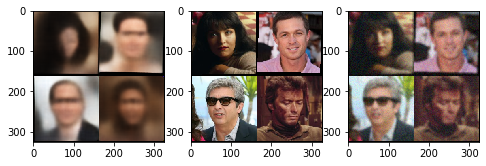

[1/10][0/4052]	Loss: 0.05895
[1/10][200/4052]	Loss: 0.05654
[1/10][400/4052]	Loss: 0.05661
[1/10][600/4052]	Loss: 0.05674
[1/10][800/4052]	Loss: 0.05671
[1/10][1000/4052]	Loss: 0.05670
[1/10][1200/4052]	Loss: 0.05675
[1/10][1400/4052]	Loss: 0.05676


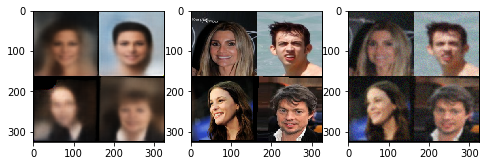

[1/10][1600/4052]	Loss: 0.05681
[1/10][1800/4052]	Loss: 0.05679
[1/10][2000/4052]	Loss: 0.05677
[1/10][2200/4052]	Loss: 0.05682
[1/10][2400/4052]	Loss: 0.05684
[1/10][2600/4052]	Loss: 0.05689
[1/10][2800/4052]	Loss: 0.05688
[1/10][3000/4052]	Loss: 0.05690


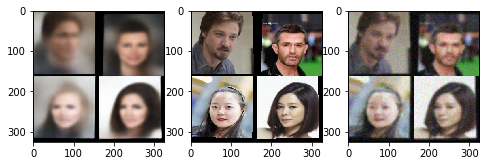

[1/10][3200/4052]	Loss: 0.05689
[1/10][3400/4052]	Loss: 0.05688
[1/10][3600/4052]	Loss: 0.05688
[1/10][3800/4052]	Loss: 0.05688
[1/10][4000/4052]	Loss: 0.05689
[1/10][4051/4052]	Loss: 0.05690
[1/10][4051/4052]	Tr Loss: 0.05690	Te Loss: 0.09474


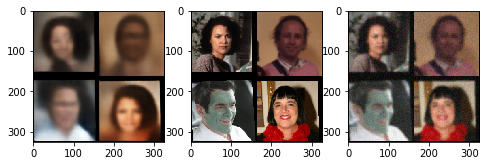

[2/10][0/4052]	Loss: 0.05935
[2/10][200/4052]	Loss: 0.05737
[2/10][400/4052]	Loss: 0.05719
[2/10][600/4052]	Loss: 0.05711
[2/10][800/4052]	Loss: 0.05697


In [0]:
train(autoencoder, optimizer, train_loader=train_loader, test_loader=test_loader, n_epochs=10, plot_images=1500)

In [0]:
# lr.step()

for pg in optimizer.param_groups:
    print(pg['lr'])

0.0007224999999999999


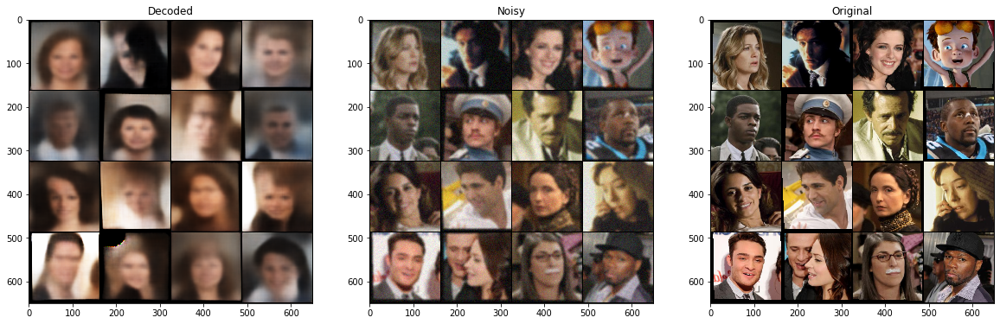

In [0]:
with torch.no_grad():
    autoencoder.train()
    inputs, labels = next(iter(test_loader))
    inputs = inputs.cuda()
    labels = labels.cuda()

    decoded = autoencoder(inputs)
    
    fig, ax = plt.subplots(1, 3, figsize=(20,60))
    ax[0].imshow(np.transpose(vutils.make_grid(decoded.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[0].set_title("Decoded")
    ax[1].imshow(np.transpose(vutils.make_grid(inputs.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[1].set_title("Noisy")
    ax[2].imshow(np.transpose(vutils.make_grid(labels.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[2].set_title("Original")
    plt.show()   

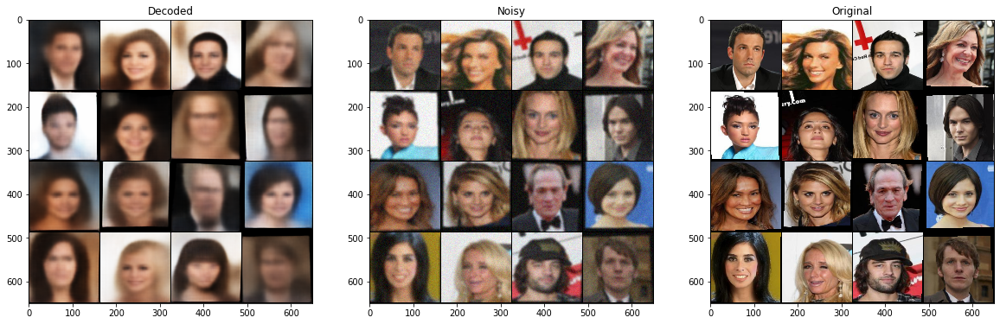

In [0]:
with torch.no_grad():
    autoencoder.train()
    inputs, labels = next(iter(train_loader))
    inputs = inputs.cuda()
    labels = labels.cuda()

    decoded = autoencoder(inputs)
    
    fig, ax = plt.subplots(1, 3, figsize=(20,60))
    ax[0].imshow(np.transpose(vutils.make_grid(decoded.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[0].set_title("Decoded")
    ax[1].imshow(np.transpose(vutils.make_grid(inputs.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[1].set_title("Noisy")
    ax[2].imshow(np.transpose(vutils.make_grid(labels.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[2].set_title("Original")
    plt.show()